<a href="https://colab.research.google.com/github/muneeb706/patient-no-show/blob/main/Patient_NoShow_Predictive_Modeling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Downloading Required Packages

In [2]:
!pip install shap

     |████████████████████████████████| 358kB 10.0MB/s 
  Created wheel for shap: filename=shap-0.39.0-cp37-cp37m-linux_x86_64.whl size=491634 sha256=b575fa00d2c4acedab92e000f100b4e5c31b89f84d45002aef37808a7faa8f7e
  Stored in directory: /root/.cache/pip/wheels/15/27/f5/a8ab9da52fd159aae6477b5ede6eaaec69fd130fa0fa59f283
Successfully built shap


In [3]:
!pip install imblearn

In [4]:
!pip install wittgenstein

     |████████████████████████████████| 81kB 5.1MB/s 


In [5]:
!pip install scikit-multiflow

     |████████████████████████████████| 1.1MB 8.5MB/s 


Importing Libraries / Packages.

In [6]:
%matplotlib inline
## Data Manipulation ##
import numpy as np
import pandas as pd
## Plotting ##
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')
## preprocessing ##
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
## Sklearn for data splitting and modeling ##
from sklearn.model_selection import train_test_split
import xgboost
## Interpretable feature selection ##
#!pip install shap
import shap
# for saving objects
import pickle
# for class balancing
from imblearn.over_sampling import SMOTE
# for RIPPER
import wittgenstein as lw
# for HOEFFDING tree
from skmultiflow.trees import HoeffdingTree
from skmultiflow.data import SEAGenerator
from skmultiflow.trees import HoeffdingTreeClassifier

The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.


Reading dataset (https://www.kaggle.com/joniarroba/noshowappointments).

In [ ]:
data = pd.read_csv('./sample_data/KaggleV2-May-2016.csv')
df = pd.DataFrame(data=data, columns=data.columns)
print(df.shape)
df.head()


(110527, 14)


,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,No-show
0,2.987250e+13,5642903,F,2016-04-29T18:38:08Z,2016-04-29T00:00:00Z,62,JARDIM DA PENHA,0,1,0,0,0,0,No
1,5.589978e+14,5642503,M,2016-04-29T16:08:27Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,0,0,0,0,0,No
2,4.262962e+12,5642549,F,2016-04-29T16:19:04Z,2016-04-29T00:00:00Z,62,MATA DA PRAIA,0,0,0,0,0,0,No
3,8.679512e+11,5642828,F,2016-04-29T17:29:31Z,2016-04-29T00:00:00Z,8,PONTAL DE CAMBURI,0,0,0,0,0,0,No
4,8.841186e+12,5642494,F,2016-04-29T16:07:23Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,1,1,0,0,0,No


Getting list of all features.

In [ ]:
df.columns

Index(['PatientId', 'AppointmentID', 'Gender', 'ScheduledDay',
       'AppointmentDay', 'Age', 'Neighbourhood', 'Scholarship', 'Hipertension',
       'Diabetes', 'Alcoholism', 'Handcap', 'SMS_received', 'No-show'],
      dtype='object')

## Feature Engineering

Generating following list of features based on AppointmentDay and Scheduled Day.

1. Scheduled Hour
1. Scheduled Day of Week
1. Scheduled Month
1. Appointment Hour
1. Appointment Day of Week
1. Appointment Month
1. Difference in Days between scheduled and appointment date
1. Same Day Appointment



Generating Scheduled Hour (AM, PM) and renaming existing ScheduledDay Feature.

In [ ]:
# renaming
df = df.rename(columns={'ScheduledDay': 'ScheduledDatetime'})
# Getting AM / PM information
scheduledHour = df.apply(lambda x: 'AM' if (int(x.ScheduledDatetime.split("T")[1].split(":")[0]) < 12)  else 'PM', axis = 1)
df.insert(4, "ScheduledHour", scheduledHour)
df.columns

Index(['PatientId', 'AppointmentID', 'Gender', 'ScheduledDatetime',
       'ScheduledHour', 'AppointmentDay', 'Age', 'Neighbourhood',
       'Scholarship', 'Hipertension', 'Diabetes', 'Alcoholism', 'Handcap',
       'SMS_received', 'No-show'],
      dtype='object')

Generating Scheduled Day of Week feature from ScheduledDay

In [ ]:
# converting to datetime object
scheduledDateTime = pd.to_datetime(df['ScheduledDatetime'])
# getting weekdays
scheduledWeekday = scheduledDateTime.dt.day_name()
# inserting weekday values in new column in dataframe
df.insert(5, "ScheduledDay", scheduledWeekday)
df.columns

Index(['PatientId', 'AppointmentID', 'Gender', 'ScheduledDatetime',
       'ScheduledHour', 'ScheduledDay', 'AppointmentDay', 'Age',
       'Neighbourhood', 'Scholarship', 'Hipertension', 'Diabetes',
       'Alcoholism', 'Handcap', 'SMS_received', 'No-show'],
      dtype='object')

Generating Scheduled Month feature.

In [ ]:
month = scheduledDateTime.dt.month_name()
# inserting month values in a new column in dataframe
df.insert(6, "ScheduledMonth", month)
df.columns

Index(['PatientId', 'AppointmentID', 'Gender', 'ScheduledDatetime',
       'ScheduledHour', 'ScheduledDay', 'ScheduledMonth', 'AppointmentDay',
       'Age', 'Neighbourhood', 'Scholarship', 'Hipertension', 'Diabetes',
       'Alcoholism', 'Handcap', 'SMS_received', 'No-show'],
      dtype='object')

Generating Appointment Hour (AM, PM) and renaming existing AppointmentDay Feature.

In [ ]:
# renaming
df = df.rename(columns={'AppointmentDay': 'AppointmentDatetime'})
appointmentHour = df.apply(lambda x: 'AM' if (int(x.AppointmentDatetime.split("T")[1].split(":")[0]) < 12)  else 'PM', axis = 1)
df.insert(8, "AppointmentHour", appointmentHour)
df.columns

Index(['PatientId', 'AppointmentID', 'Gender', 'ScheduledDatetime',
       'ScheduledHour', 'ScheduledDay', 'ScheduledMonth',
       'AppointmentDatetime', 'AppointmentHour', 'Age', 'Neighbourhood',
       'Scholarship', 'Hipertension', 'Diabetes', 'Alcoholism', 'Handcap',
       'SMS_received', 'No-show'],
      dtype='object')

Generating Appointment Day of Week feature.

In [ ]:
# converting to datetime object
appointmentDateTime = pd.to_datetime(df['AppointmentDatetime'])
# getting weekdays
appointmentWeekday = appointmentDateTime.dt.day_name()
# inserting weekday values in new column in dataframe
df.insert(9, "AppointmentDay", appointmentWeekday)
df.columns

Index(['PatientId', 'AppointmentID', 'Gender', 'ScheduledDatetime',
       'ScheduledHour', 'ScheduledDay', 'ScheduledMonth',
       'AppointmentDatetime', 'AppointmentHour', 'AppointmentDay', 'Age',
       'Neighbourhood', 'Scholarship', 'Hipertension', 'Diabetes',
       'Alcoholism', 'Handcap', 'SMS_received', 'No-show'],
      dtype='object')

Generating Appointment Month feature.

In [ ]:
appointmentMonth = appointmentDateTime.dt.month_name()
# inserting month values in a new column in dataframe
df.insert(10, "AppointmentMonth", appointmentMonth)
df.columns

Index(['PatientId', 'AppointmentID', 'Gender', 'ScheduledDatetime',
       'ScheduledHour', 'ScheduledDay', 'ScheduledMonth',
       'AppointmentDatetime', 'AppointmentHour', 'AppointmentDay',
       'AppointmentMonth', 'Age', 'Neighbourhood', 'Scholarship',
       'Hipertension', 'Diabetes', 'Alcoholism', 'Handcap', 'SMS_received',
       'No-show'],
      dtype='object')

Generating difference in days between scheduled and appointment datetime feature.

In [ ]:
  # Calculating difference in days between appointmentdatetime and scheduleddatetime after removing time information 
  difference = (appointmentDateTime.dt.date.astype('datetime64[ns]') - scheduledDateTime.dt.date.astype('datetime64[ns]')).dt.days
  df.insert(11, "Difference", difference)
  df.columns

Index(['PatientId', 'AppointmentID', 'Gender', 'ScheduledDatetime',
       'ScheduledHour', 'ScheduledDay', 'ScheduledMonth',
       'AppointmentDatetime', 'AppointmentHour', 'AppointmentDay',
       'AppointmentMonth', 'Difference', 'Age', 'Neighbourhood', 'Scholarship',
       'Hipertension', 'Diabetes', 'Alcoholism', 'Handcap', 'SMS_received',
       'No-show'],
      dtype='object')

Generating same day appointment feature.

In [ ]:
# getting only scheduled date by removing time
scheduledDate = df.ScheduledDatetime.str.split("T").str[0]
# getting only appointment date by removing time
appointmentDate = df.AppointmentDatetime.str.split("T").str[0]
# comparing ScheduledDatetime and AppointmentDatetime columns to calculate SameDayAppointment
sameDayAppointment = df.apply(lambda x: 1 if (x.ScheduledDatetime.split("T")[0] == x.AppointmentDatetime.split("T")[0])  else 0, axis = 1)
df.insert(12, "SameDayAppointment", sameDayAppointment)
df.columns

Index(['PatientId', 'AppointmentID', 'Gender', 'ScheduledDatetime',
       'ScheduledHour', 'ScheduledDay', 'ScheduledMonth',
       'AppointmentDatetime', 'AppointmentHour', 'AppointmentDay',
       'AppointmentMonth', 'Difference', 'SameDayAppointment', 'Age',
       'Neighbourhood', 'Scholarship', 'Hipertension', 'Diabetes',
       'Alcoholism', 'Handcap', 'SMS_received', 'No-show'],
      dtype='object')

Verifiying data after feature engineering.

In [ ]:
print(df.shape)
df.head(20)

(110527, 22)


,PatientId,AppointmentID,Gender,ScheduledDatetime,ScheduledHour,ScheduledDay,ScheduledMonth,AppointmentDatetime,AppointmentHour,AppointmentDay,AppointmentMonth,Difference,SameDayAppointment,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,No-show
0,2.987250e+13,5642903,F,2016-04-29T18:38:08Z,PM,Friday,April,2016-04-29T00:00:00Z,AM,Friday,April,0,1,62,JARDIM DA PENHA,0,1,0,0,0,0,No
1,5.589978e+14,5642503,M,2016-04-29T16:08:27Z,PM,Friday,April,2016-04-29T00:00:00Z,AM,Friday,April,0,1,56,JARDIM DA PENHA,0,0,0,0,0,0,No
2,4.262962e+12,5642549,F,2016-04-29T16:19:04Z,PM,Friday,April,2016-04-29T00:00:00Z,AM,Friday,April,0,1,62,MATA DA PRAIA,0,0,0,0,0,0,No
3,8.679512e+11,5642828,F,2016-04-29T17:29:31Z,PM,Friday,April,2016-04-29T00:00:00Z,AM,Friday,April,0,1,8,PONTAL DE CAMBURI,0,0,0,0,0,0,No
4,8.841186e+12,5642494,F,2016-04-29T16:07:23Z,PM,Friday,April,2016-04-29T00:00:00Z,AM,Friday,April,0,1,56,JARDIM DA PENHA,0,1,1,0,0,0,No
5,9.598513e+13,5626772,F,2016-04-27T08:36:51Z,AM,Wednesday,April,2016-04-29T00:00:00Z,AM,Friday,April,2,0,76,REPÚBLICA,0,1,0,0,0,0,No
6,7.336882e+14,5630279,F,2016-04-27T15:05:12Z,PM,Wednesday,April,2016-04-29T00:00:00Z,AM,Friday,April,2,0,23,GOIABEIRAS,0,0,0,0,0,0,Yes
7,3.449833e+12,5630575,F,2016-04-27T15:39:58Z,PM,Wednesday,April,2016-04-29T00:00:00Z,AM,Friday,April,2,0,39,GOIABEIRAS,0,0,0,0,0,0,Yes
8,5.639473e+13,5638447,F,2016-04-29T08:02:16Z,AM,Friday,April,2016-04-29T00:00:00Z,AM,Friday,April,0,1,21,ANDORINHAS,0,0,0,0,0,0,No
9,7.812456e+13,5629123,F,2016-04-27T12:48:25Z,PM,Wednesday,April,2016-04-29T00:00:00Z,AM,Friday,April,2,0,19,CONQUISTA,0,0,0,0,0,0,No


## Preprocessing

Dropping unnecessary columns, that are unrelate to the problem we are trying to solve.

In [ ]:
df = df.drop(['PatientId','AppointmentID','ScheduledDatetime', 'AppointmentDatetime'], axis = 1)

Splitting indepdendent and response / target features.

In [ ]:
X = df.drop('No-show', axis=1)
Y = pd.DataFrame(df['No-show'])

Hot Encoding categorical features.

In [ ]:
X = pd.get_dummies(X, columns=["Gender", "ScheduledHour", "ScheduledDay", "ScheduledMonth", "AppointmentHour", "AppointmentDay", "AppointmentMonth", "Neighbourhood"])

X_features = X.columns
print(X.shape)
X.head(10)

(110527, 118)


,Difference,SameDayAppointment,Age,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Gender_F,Gender_M,ScheduledHour_AM,ScheduledHour_PM,ScheduledDay_Friday,ScheduledDay_Monday,ScheduledDay_Saturday,ScheduledDay_Thursday,ScheduledDay_Tuesday,ScheduledDay_Wednesday,ScheduledMonth_April,ScheduledMonth_December,ScheduledMonth_February,ScheduledMonth_January,ScheduledMonth_June,ScheduledMonth_March,ScheduledMonth_May,ScheduledMonth_November,AppointmentHour_AM,AppointmentDay_Friday,AppointmentDay_Monday,AppointmentDay_Saturday,AppointmentDay_Thursday,AppointmentDay_Tuesday,AppointmentDay_Wednesday,AppointmentMonth_April,AppointmentMonth_June,AppointmentMonth_May,Neighbourhood_AEROPORTO,Neighbourhood_ANDORINHAS,Neighbourhood_ANTÔNIO HONÓRIO,...,Neighbourhood_JOANA D´ARC,Neighbourhood_JUCUTUQUARA,Neighbourhood_MARIA ORTIZ,Neighbourhood_MARUÍPE,Neighbourhood_MATA DA PRAIA,Neighbourhood_MONTE BELO,Neighbourhood_MORADA DE CAMBURI,Neighbourhood_MÁRIO CYPRESTE,Neighbourhood_NAZARETH,Neighbourhood_NOVA PALESTINA,Neighbourhood_PARQUE INDUSTRIAL,Neighbourhood_PARQUE MOSCOSO,Neighbourhood_PIEDADE,Neighbourhood_PONTAL DE CAMBURI,Neighbourhood_PRAIA DO CANTO,Neighbourhood_PRAIA DO SUÁ,Neighbourhood_REDENÇÃO,Neighbourhood_REPÚBLICA,Neighbourhood_RESISTÊNCIA,Neighbourhood_ROMÃO,Neighbourhood_SANTA CECÍLIA,Neighbourhood_SANTA CLARA,Neighbourhood_SANTA HELENA,Neighbourhood_SANTA LUÍZA,Neighbourhood_SANTA LÚCIA,Neighbourhood_SANTA MARTHA,Neighbourhood_SANTA TEREZA,Neighbourhood_SANTO ANDRÉ,Neighbourhood_SANTO ANTÔNIO,Neighbourhood_SANTOS DUMONT,Neighbourhood_SANTOS REIS,Neighbourhood_SEGURANÇA DO LAR,Neighbourhood_SOLON BORGES,Neighbourhood_SÃO BENEDITO,Neighbourhood_SÃO CRISTÓVÃO,Neighbourhood_SÃO JOSÉ,Neighbourhood_SÃO PEDRO,Neighbourhood_TABUAZEIRO,Neighbourhood_UNIVERSITÁRIO,Neighbourhood_VILA RUBIM
0,0,1,62,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,1,56,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,1,62,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,1,8,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,1,56,0,1,1,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,2,0,76,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,2,0,23,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,2,0,39,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,1,21,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,2,0,19,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Label encoding target feature.

In [ ]:
le = LabelEncoder()
Y = Y.apply(le.fit_transform)

Splitting the data into 80% and 20% test data using the train_test_split function.

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = 19)

Saving data files for future reuse.

In [ ]:
filename = './sample_data/X_train.sav'
pickle.dump(X_train, open(filename, 'wb'))

filename = './sample_data/X_test.sav'
pickle.dump(X_test, open(filename, 'wb'))

filename = './sample_data/Y_train.sav'
pickle.dump(Y_train, open(filename, 'wb'))

filename = './sample_data/Y_test.sav'
pickle.dump(Y_test, open(filename, 'wb'))

Loading data files.

In [ ]:
filename = './sample_data/X_train.sav'
X_train = pickle.load(open(filename, 'rb'))

filename = './sample_data/X_test.sav'
X_test = pickle.load(open(filename, 'rb'))

filename = './sample_data/Y_train.sav'
Y_train = pickle.load(open(filename, 'rb'))

filename = './sample_data/Y_test.sav'
Y_test = pickle.load(open(filename, 'rb'))

## Feature Selection
Using Shapley Additive Explanations (SHAP).

Fitting XGBOOST model.

In [ ]:
import xgboost

d_train = xgboost.DMatrix(X_train, label=Y_train)
d_test = xgboost.DMatrix(X_test, label=Y_test)

params = {
    "eta": 0.01,
    "objective": "binary:logistic",
    "subsample": 0.5,
    "base_score": np.mean(Y_train.values.ravel()),
    "eval_metric": "logloss"
}
model = xgboost.train(params, d_train, 5000, evals = [(d_test, "test")], verbose_eval=100, early_stopping_rounds=20)

[0]	test-logloss:0.504825
Will train until test-logloss hasn't improved in 20 rounds.
[100]	test-logloss:0.453787
[200]	test-logloss:0.442047
[300]	test-logloss:0.438708
[400]	test-logloss:0.437256
[500]	test-logloss:0.436494
[600]	test-logloss:0.435927
[700]	test-logloss:0.435536
[800]	test-logloss:0.435158
[900]	test-logloss:0.434863
[1000]	test-logloss:0.434609
[1100]	test-logloss:0.434349
[1200]	test-logloss:0.434139
[1300]	test-logloss:0.433918
[1400]	test-logloss:0.433699
[1500]	test-logloss:0.433532
[1600]	test-logloss:0.433423
Stopping. Best iteration:
[1636]	test-logloss:0.433384



Saving Model.

In [ ]:
filename = './sample_data/XGB_model.sav'
pickle.dump(model, open(filename, 'wb'))

Reading Model.

In [ ]:
# load the model from disk
filename = './sample_data/XGB_model.sav'
model = pickle.load(open(filename, 'rb'))
# result = loaded_model.score(X_test, Y_test)

Plotting feature importance based on XGBOOST model.

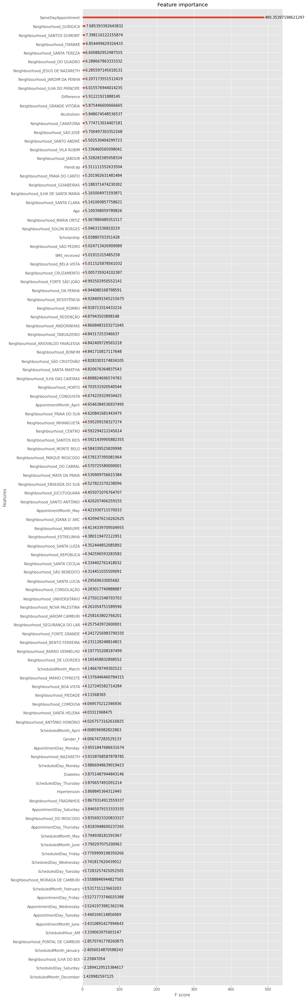

In [ ]:
ax = xgboost.plot_importance(model, importance_type='gain') 
fig = ax.figure
fig.set_size_inches(10, 50)

### SHAP importance

In [ ]:
ex = shap.TreeExplainer(model)

In [ ]:
shap_values = ex.shap_values(X_test)

Saving shap_values.

In [ ]:
filename = './sample_data/shap_values.sav'
pickle.dump(shap_values, open(filename, 'wb'))

Reading shap_values.

In [ ]:
filename = './sample_data/shap_values.sav'
shap_values = pickle.load(open(filename, 'rb'))

SHAP summary plot.

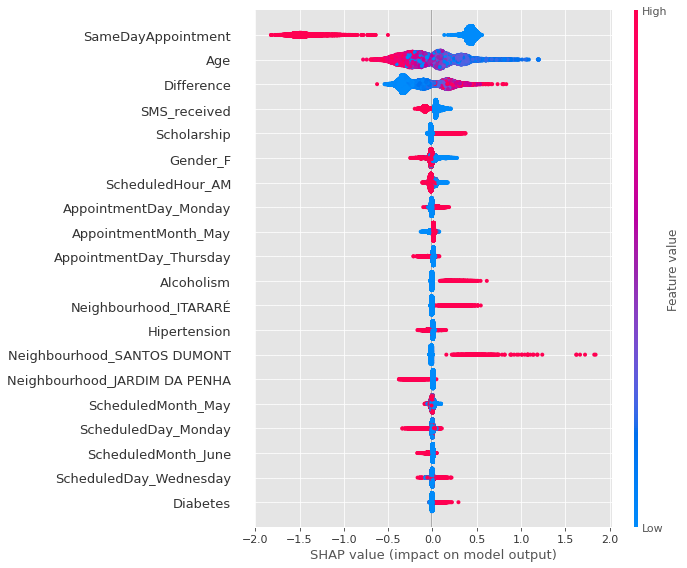

In [ ]:
shap.summary_plot(shap_values, X_test)

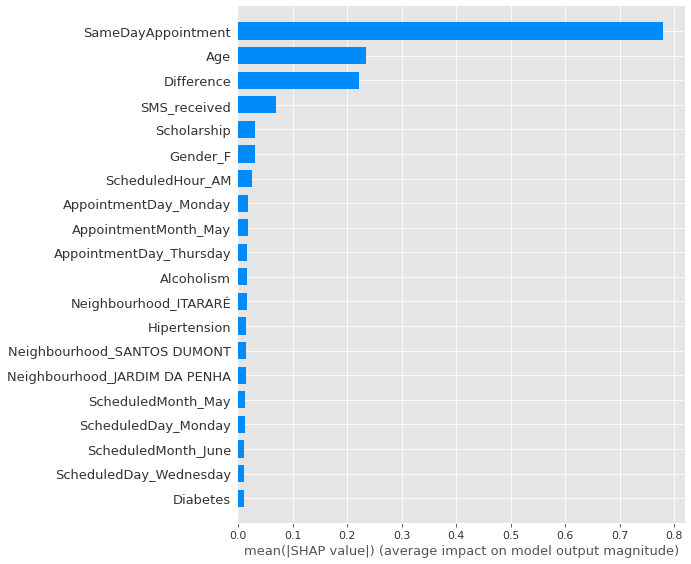

In [ ]:
# Plot summary_plot as barplot:
shap.summary_plot(shap_values, X_test, plot_type='bar')

Sorting feature importance based on the shap values.

In [ ]:
vals= np.abs(shap_values).mean(0)
feature_importance = pd.DataFrame(list(zip(X_train.columns,vals)),columns=['col_name','feature_importance_vals'])
feature_importance.sort_values(by=['feature_importance_vals'],ascending=False,inplace=True)
feature_importance.head(20)


,col_name,feature_importance_vals
1,SameDayAppointment,0.780255
2,Age,0.234135
0,Difference,0.222584
8,SMS_received,0.068501
3,Scholarship,0.031700
9,Gender_F,0.030471
11,ScheduledHour_AM,0.025083
29,AppointmentDay_Monday,0.018447
36,AppointmentMonth_May,0.018135
31,AppointmentDay_Thursday,0.016459


In [ ]:
t20_imp_features = feature_importance['col_name'].values[0:20]
t20_imp_features

array(['SameDayAppointment', 'Age', 'Difference', 'SMS_received',
       'Scholarship', 'Gender_F', 'ScheduledHour_AM',
       'AppointmentDay_Monday', 'AppointmentMonth_May',
       'AppointmentDay_Thursday', 'Alcoholism', 'Neighbourhood_ITARARÉ',
       'Hipertension', 'Neighbourhood_SANTOS DUMONT',
       'Neighbourhood_JARDIM DA PENHA', 'ScheduledMonth_May',
       'ScheduledDay_Monday', 'ScheduledMonth_June',
       'ScheduledDay_Wednesday', 'Diabetes'], dtype=object)

Dependence Plot.

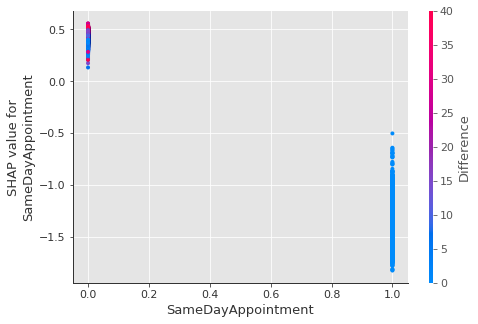

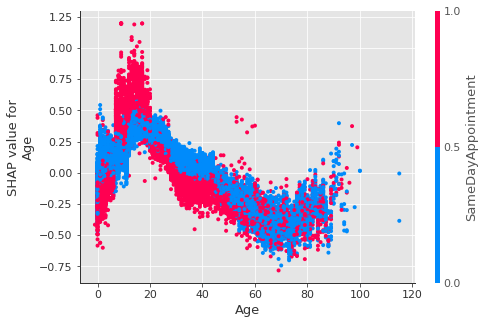

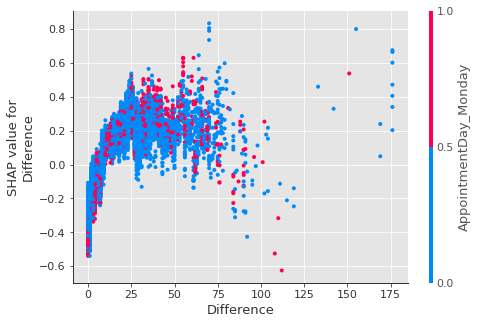

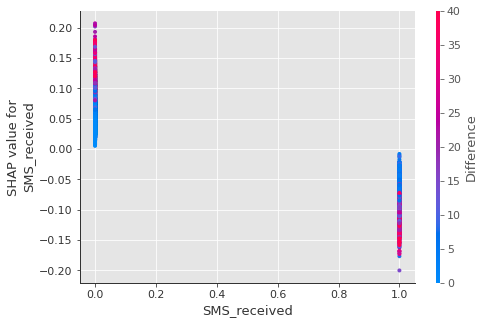

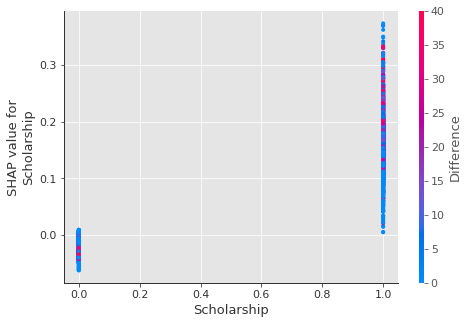

...

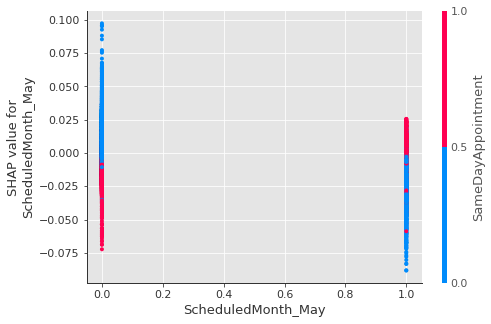

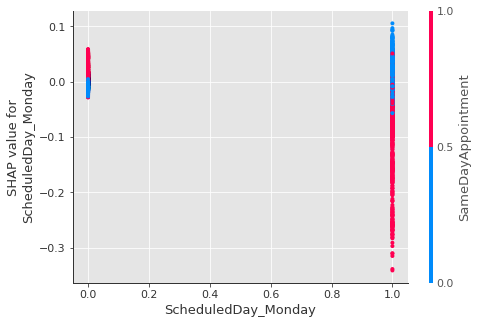

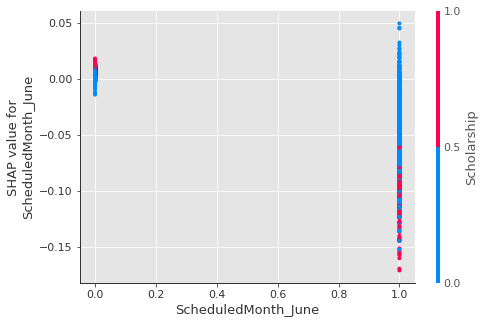

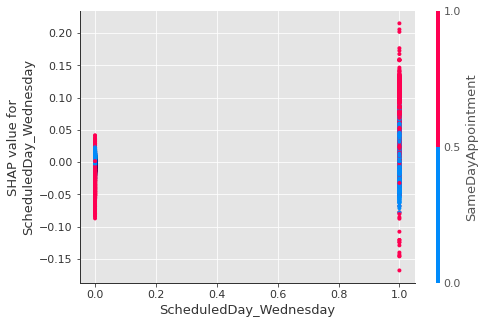

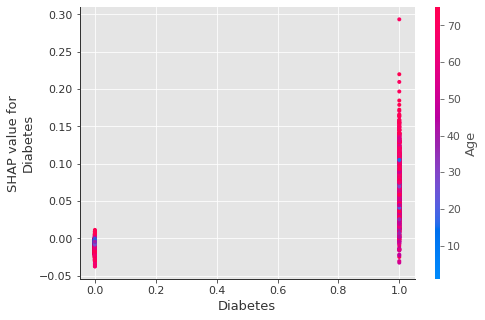

In [ ]:
for feature in t20_imp_features:
  shap.dependence_plot(feature, shap_values, X_test)

Local Interpretability.

In [ ]:
shap.initjs()
shap.force_plot(ex.expected_value, shap_values[0,:], X_train.iloc[0,:])


In [ ]:
shap.initjs()
shap.force_plot(ex.expected_value, shap_values[:1000,:], X_train.iloc[:1000,:])

Extract data containing only the top 20 features selected by SHAP.

In [ ]:
X_train_fs = X_train[t20_imp_features]
X_test_fs = X_test[t20_imp_features]

filename = './sample_data/X_train_fs.sav'
pickle.dump(X_train_fs, open(filename, 'wb'))

filename = './sample_data/X_test_fs.sav'
pickle.dump(X_test_fs, open(filename, 'wb'))

In [ ]:
filename = './sample_data/X_train_fs.sav'
X_train_fs = pickle.load(open(filename, 'rb'))

filename = './sample_data/X_test_fs.sav'
X_test_fs = pickle.load(open(filename, 'rb'))

## Class Imbalance Problem

Will use SMOTE technique to address this problem.

Exploring percentage of Yes and No values in 'No-show' / target feature. 

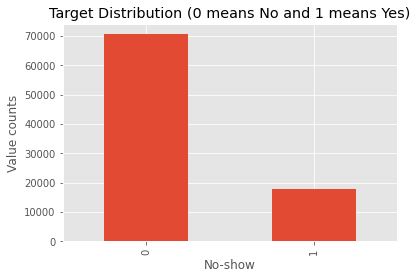

In [ ]:
Y_train['No-show'].value_counts().plot(kind='bar',title= 'Target Distribution (0 means No and 1 means Yes)', xlabel= 'No-show', ylabel= 'Value counts')

In [ ]:
class_no = round(100 * Y_train['No-show'].value_counts()[0]/Y_train.shape[0])
class_yes = round(100 * Y_train['No-show'].value_counts()[1]/Y_train.shape[0])
print(f'Percentage of cases per class no is {class_no}%')
print(f'Percentage of cases per class yes is {class_yes}%')

Percentage of cases per class no is 80%
Percentage of cases per class yes is 20%


Applying SMOTE

In [ ]:
sm = SMOTE(random_state=2)
X_train_fs_cb, Y_train_cb = sm.fit_sample(X_train_fs, Y_train.values.ravel())

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.


In [ ]:
print("After OverSampling, counts of class 'no': {}".format(sum(Y_train_cb==1)))
print("After OverSampling, counts of class 'yes': {}".format(sum(Y_train_cb==0)))

After OverSampling, counts of class 'no': 70611
After OverSampling, counts of class 'yes': 70611


Converting Back to dataframe.

In [ ]:
X_train_fs_cb = pd.DataFrame(X_train_fs_cb, columns=t20_imp_features)
Y_train_cb = pd.DataFrame(Y_train_cb, columns=['No-show'])

Saving and Loading preprocessed training datasets.

In [ ]:
filename = './sample_data/X_train_fs_cb.sav'
pickle.dump(X_train_fs_cb, open(filename, 'wb'))

filename = './sample_data/Y_train_cb.sav'
pickle.dump(Y_train_cb, open(filename, 'wb'))

In [ ]:
filename = './sample_data/X_train_fs_cb.sav'
X_train_fs_cb = pickle.load(open(filename, 'rb'))

filename = './sample_data/Y_train_cb.sav'
Y_train_cb = pickle.load(open(filename, 'rb'))

## Predictive Modeling

1. RIPPER
2. Hoeffding Trees

## Without Class Balancing.

### Fitting RIPPER model

In [ ]:
ripper_clf = lw.RIPPER(random_state=42, verbosity=2)

Using GridSearchCV to find best parameters for the model and fitting the model with that parameters and training data after feature selection.

In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = {"prune_size": [0.33, 0.5], "k": [1, 2]}
ripper_grid = GridSearchCV(estimator=ripper_clf, param_grid=param_grid, refit=True, verbose=3, cv=5)
ripper_grid.fit(X_train_fs, Y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] k=1, prune_size=0.33 ............................................
fitting bins for features ['Age', 'Difference']



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


growing ruleset...

pos_growset 9546 pos_pruneset 4702
neg_growset 37846 neg_pruneset 18642
grew rule: [SameDayAppointment=0^Age=14-22^ScheduledMonth_May=0^SMS_received=0^AppointmentMonth_May=1^ScheduledDay_Wednesday=0^Scholarship=1^Difference=15-26^AppointmentDay_Monday=0^ScheduledHour_AM=0^ScheduledDay_Monday=0]
pruned rule unchanged
updated ruleset: [SameDayAppointment=0^Age=14-22^ScheduledMonth_May=0^SMS_received=0^AppointmentMonth_May=1^ScheduledDay_Wednesday=0^Scholarship=1^Difference=15-26^AppointmentDay_Monday=0^ScheduledHour_AM=0^ScheduledDay_Monday=0]

pos_growset 9542 pos_pruneset 4701
neg_growset 37846 neg_pruneset 18641
grew rule: [SameDayAppointment=0^Hipertension=0^Age=14-22^SMS_received=0^Difference=26-47^AppointmentMonth_May=1^ScheduledDay_Wednesday=0^ScheduledDay_Monday=1^Gender_F=1^ScheduledHour_AM=1^AppointmentDay_Monday=1]
pruned rule unchanged
updated ruleset: [SameDayAppointment=0^Age=14-22^ScheduledMonth_May=0^SMS_received=0^AppointmentMonth_May=1^ScheduledDay_W

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   40.9s remaining:    0.0s


growing ruleset...

pos_growset 9546 pos_pruneset 4702
neg_growset 37847 neg_pruneset 18642
grew rule: [SameDayAppointment=0^ScheduledMonth_May=0^AppointmentMonth_May=1^SMS_received=0^Difference=15-26^Neighbourhood_ITARARÉ=1^ScheduledHour_AM=0^Hipertension=1]
pruned rule: [SameDayAppointment=0^ScheduledMonth_May=0^AppointmentMonth_May=1^SMS_received=0^Difference=15-26^Neighbourhood_ITARARÉ=1]
updated ruleset: [SameDayAppointment=0^ScheduledMonth_May=0^AppointmentMonth_May=1^SMS_received=0^Difference=15-26^Neighbourhood_ITARARÉ=1]

pos_growset 9485 pos_pruneset 4673
neg_growset 37803 neg_pruneset 18620
grew rule: [SameDayAppointment=0^ScheduledMonth_May=0^AppointmentMonth_May=1^SMS_received=0^Difference=15-26^Gender_F=0^Age=47-54^ScheduledDay_Monday=1^Alcoholism=0^ScheduledHour_AM=0]
pruned rule unchanged
updated ruleset: [SameDayAppointment=0^ScheduledMonth_May=0^AppointmentMonth_May=1^SMS_received=0^Difference=15-26^Neighbourhood_ITARARÉ=1] V [SameDayAppointment=0^ScheduledMonth_May=0

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:  1.1min remaining:    0.0s


growing ruleset...

pos_growset 9546 pos_pruneset 4702
neg_growset 37847 neg_pruneset 18642
grew rule: [SameDayAppointment=0^Hipertension=0^ScheduledMonth_May=0^SMS_received=0^ScheduledMonth_June=0^Scholarship=1^ScheduledDay_Wednesday=1^ScheduledHour_AM=0^Difference=0-2]
pruned rule unchanged
updated ruleset: [SameDayAppointment=0^Hipertension=0^ScheduledMonth_May=0^SMS_received=0^ScheduledMonth_June=0^Scholarship=1^ScheduledDay_Wednesday=1^ScheduledHour_AM=0^Difference=0-2]

pos_growset 9542 pos_pruneset 4701
neg_growset 37845 neg_pruneset 18641
grew rule: [SameDayAppointment=0^Hipertension=0^ScheduledMonth_May=0^SMS_received=0^AppointmentMonth_May=1^Scholarship=1^Age=38-46^Difference=8-15^ScheduledHour_AM=0]
pruned rule unchanged
updated ruleset: [SameDayAppointment=0^Hipertension=0^ScheduledMonth_May=0^SMS_received=0^ScheduledMonth_June=0^Scholarship=1^ScheduledDay_Wednesday=1^ScheduledHour_AM=0^Difference=0-2] V [SameDayAppointment=0^Hipertension=0^ScheduledMonth_May=0^SMS_received

[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed: 12.2min finished


growing ruleset...

pos_growset 11932 pos_pruneset 5878
neg_growset 47309 neg_pruneset 23302
grew rule: [SameDayAppointment=0^Hipertension=0^ScheduledMonth_May=0^AppointmentMonth_May=1^SMS_received=0^Scholarship=1^ScheduledDay_Monday=1^AppointmentDay_Monday=1^Age=5-14]
pruned rule: [SameDayAppointment=0^Hipertension=0^ScheduledMonth_May=0^AppointmentMonth_May=1^SMS_received=0^Scholarship=1^ScheduledDay_Monday=1^AppointmentDay_Monday=1]
updated ruleset: [SameDayAppointment=0^Hipertension=0^ScheduledMonth_May=0^AppointmentMonth_May=1^SMS_received=0^Scholarship=1^ScheduledDay_Monday=1^AppointmentDay_Monday=1]

pos_growset 11916 pos_pruneset 5870
neg_growset 47301 neg_pruneset 23298
grew rule: [SameDayAppointment=0^ScheduledMonth_May=0^AppointmentMonth_May=1^SMS_received=0^Difference=15-26^ScheduledDay_Wednesday=0^Neighbourhood_JARDIMDAPENHA=0^ScheduledDay_Monday=0^Age=22-31^Gender_F=0^AppointmentDay_Thursday=0^Neighbourhood_ITARARÉ=1]
pruned rule unchanged
updated ruleset: [SameDayAppoint

GridSearchCV(cv=5, error_score=nan,
             estimator=<RIPPER(prune_size=0.33, verbosity=2, k=2, max_rules=None, max_total_conds=None, max_rule_conds=None, random_state=42, dl_allowance=64, n_discretize_bins=10)>,
             iid='deprecated', n_jobs=None,
             param_grid={'k': [1, 2], 'prune_size': [0.33, 0.5]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=3)

In [ ]:
filename = './sample_data/ripper_grid.sav'
pickle.dump(ripper_grid, open(filename, 'wb'))

In [ ]:
filename = './sample_data/ripper_grid.sav'
ripper_grid = pickle.load(open(filename, 'rb'))

In [ ]:
ripper_grid.cv_results_

{'mean_fit_time': array([34.46393247, 35.65902281, 39.66058803, 36.02268548]),
 'mean_score_time': array([0.19125862, 0.1950655 , 0.19514513, 0.19754858]),
 'mean_test_score': array([1., 1., 1., 1.]),
 'param_k': masked_array(data=[1, 1, 2, 2],
              mask=[False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_prune_size': masked_array(data=[0.33, 0.5, 0.33, 0.5],
              mask=[False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'k': 1, 'prune_size': 0.33},
  {'k': 1, 'prune_size': 0.5},
  {'k': 2, 'prune_size': 0.33},
  {'k': 2, 'prune_size': 0.5}],
 'rank_test_score': array([1, 1, 1, 1], dtype=int32),
 'split0_test_score': array([1., 1., 1., 1.]),
 'split1_test_score': array([1., 1., 1., 1.]),
 'split2_test_score': array([1., 1., 1., 1.]),
 'split3_test_score': array([1., 1., 1., 1.]),
 'split4_test_score': array([1., 1., 1., 1.]),
 'std_fit_time': array([5.00738012, 4.24050938, 7.58087605, 4.14

In [ ]:
ripper_grid.score(X_test_fs, Y_test.values.ravel())

0.7966615398534335

In [ ]:
from sklearn.metrics import precision_score, recall_score
precision = ripper_grid.best_estimator_.score(X_test_fs, Y_test.values, precision_score)
recall = ripper_grid.best_estimator_.score(X_test_fs, Y_test.values, recall_score)
cond_count = ripper_grid.best_estimator_.ruleset_.count_conds()
print(f'precision: {precision} recall: {recall} conds: {cond_count}')

precision: 0.5603448275862069 recall: 0.014415613218008428 conds: 32


In [ ]:
ripper_grid.best_estimator_.ruleset_

<Ruleset [SameDayAppointment=0^Hipertension=0^ScheduledMonth_May=0^AppointmentMonth_May=1^SMS_received=0^Scholarship=1^ScheduledDay_Monday=1^AppointmentDay_Monday=1] V [SameDayAppointment=0^ScheduledMonth_May=0^AppointmentMonth_May=1^SMS_received=0^Hipertension=0^ScheduledHour_AM=0^Age=0-5^AppointmentDay_Monday=1] V [SameDayAppointment=0^Hipertension=0^ScheduledMonth_May=0^Difference=15-26^Neighbourhood_ITARARÉ=1] V [SameDayAppointment=0^Hipertension=0^ScheduledMonth_May=0^AppointmentMonth_May=1^SMS_received=0^Age=14-22^Difference=26-47^ScheduledDay_Wednesday=0^ScheduledHour_AM=1^Gender_F=1^AppointmentDay_Thursday=0]>

### Fitting HOEFFDING Trees Model

 Define a tree for fitting the complete dataset and one for streaming.

In [ ]:
ht_complete = HoeffdingTree()
ht_partial = HoeffdingTree()

'HoeffdingTree' has been renamed to 'HoeffdingTreeClassifier' in v0.5.0.
The old name will be removed in v0.7.0


Using Cross Validations to choose best parameters and to fit the complete dataset.

In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = {"split_criterion": ['gini', 'info_gain', 'hellinger'], "leaf_prediction": ['nb', 'nba']}
ht_complete_grid = GridSearchCV(estimator=ht_complete, param_grid=param_grid, refit=True, verbose=3, cv=5)
ht_complete_grid.fit(X_train_fs.values, Y_train.values.ravel())

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV] leaf_prediction=nb, split_criterion=gini ........................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  leaf_prediction=nb, split_criterion=gini, score=0.771, total=  21.7s
[CV] leaf_prediction=nb, split_criterion=gini ........................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   21.7s remaining:    0.0s


[CV]  leaf_prediction=nb, split_criterion=gini, score=0.769, total=  21.6s
[CV] leaf_prediction=nb, split_criterion=gini ........................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:   43.3s remaining:    0.0s


[CV]  leaf_prediction=nb, split_criterion=gini, score=0.758, total=  21.5s
[CV] leaf_prediction=nb, split_criterion=gini ........................
[CV]  leaf_prediction=nb, split_criterion=gini, score=0.769, total=  21.5s
[CV] leaf_prediction=nb, split_criterion=gini ........................
[CV]  leaf_prediction=nb, split_criterion=gini, score=0.752, total=  21.7s
[CV] leaf_prediction=nb, split_criterion=info_gain ...................
[CV]  leaf_prediction=nb, split_criterion=info_gain, score=0.773, total=  22.5s
[CV] leaf_prediction=nb, split_criterion=info_gain ...................
[CV]  leaf_prediction=nb, split_criterion=info_gain, score=0.774, total=  22.6s
[CV] leaf_prediction=nb, split_criterion=info_gain ...................
[CV]  leaf_prediction=nb, split_criterion=info_gain, score=0.781, total=  22.6s
[CV] leaf_prediction=nb, split_criterion=info_gain ...................
[CV]  leaf_prediction=nb, split_criterion=info_gain, score=0.775, total=  22.6s
[CV] leaf_prediction=nb, spli

[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed: 13.7min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=HoeffdingTreeClassifier(binary_split=False, grace_period=200,
                        leaf_prediction='nba', max_byte_size=33554432,
                        memory_estimate_period=1000000, nb_threshold=0,
                        no_preprune=False, nominal_attributes=None,
                        remove_poor_atts=False, split_confidence=1e-07,
                        split_criterion='info_gain', stop_mem_management=False,
                        tie_threshold=0.05),
             iid='deprecated', n_jobs=None,
             param_grid={'leaf_prediction': ['nb', 'nba'],
                         'split_criterion': ['gini', 'info_gain', 'hellinger']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=3)

In [ ]:
filename = './sample_data/ht_complete_grid.sav'
pickle.dump(ht_complete_grid, open(filename, 'wb'))

In [ ]:
filename = './sample_data/ht_complete_grid.sav'
ht_complete_grid = pickle.load(open(filename, 'rb'))

In [ ]:
ht_complete_grid.cv_results_

{'mean_fit_time': array([17.13261499, 18.06955504, 17.76612382, 30.61458359, 31.38091822,
        30.89916339]),
 'mean_score_time': array([4.46673369, 4.52141814, 4.56592994, 1.75280328, 1.43008041,
        1.61860442]),
 'mean_test_score': array([0.76382299, 0.77617311, 0.77483864, 0.79383857, 0.79771774,
        0.79706183]),
 'param_leaf_prediction': masked_array(data=['nb', 'nb', 'nb', 'nba', 'nba', 'nba'],
              mask=[False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_split_criterion': masked_array(data=['gini', 'info_gain', 'hellinger', 'gini', 'info_gain',
                    'hellinger'],
              mask=[False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'leaf_prediction': 'nb', 'split_criterion': 'gini'},
  {'leaf_prediction': 'nb', 'split_criterion': 'info_gain'},
  {'leaf_prediction': 'nb', 'split_criterion': 'hellinger'},
  {'leaf_prediction': 'nba', 'sp

In [ ]:
ht_complete_score = ht_complete_grid.best_estimator_.score(X_test_fs.values, Y_test.values)
ht_complete_score

0.7945806568352484

Best parameters.

In [ ]:
ht_complete_grid.best_params_

{'leaf_prediction': 'nba', 'split_criterion': 'info_gain'}

Streaming Samples one after another using partial fit.

'HoeffdingTree' has been renamed to 'HoeffdingTreeClassifier' in v0.5.0.
The old name will be removed in v0.7.0


Score when streaming after 0 samples: 0.7960282276305075
(Almost) full score reached! Continue for another 20 samples.
Score when streaming after 1 samples: 0.7960282276305075
(Almost) full score reached! Continue for another 19 samples.
Score when streaming after 2 samples: 0.7960282276305075
(Almost) full score reached! Continue for another 18 samples.
Score when streaming after 3 samples: 0.7960282276305075
(Almost) full score reached! Continue for another 17 samples.
Score when streaming after 4 samples: 0.7960282276305075
(Almost) full score reached! Continue for another 16 samples.
Score when streaming after 5 samples: 0.7830000904731748
Score when streaming after 6 samples: 0.7830000904731748
Score when streaming after 7 samples: 0.7872975662716005
(Almost) full score reached! Continue for another 15 samples.
Score when streaming after 8 samples: 0.7492535963086945
Score when streaming after 9 samples: 0.7960282276305075
(Almost) full score reached! Continue for another 14 sampl

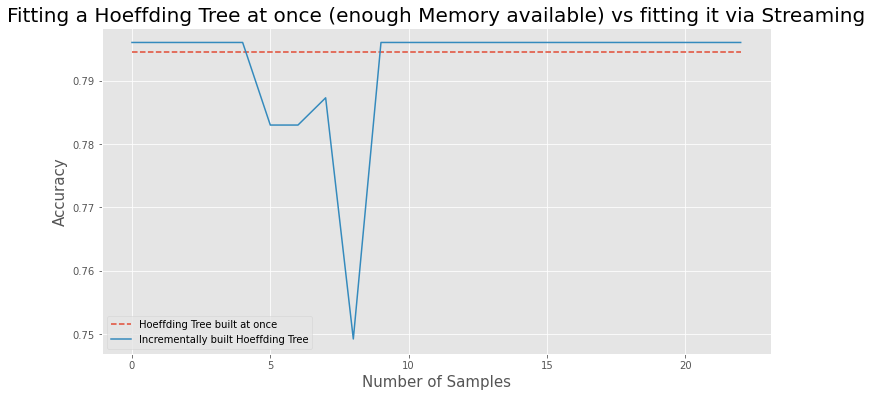

In [ ]:
timer = False
j = 0
res = []

ht_partial = HoeffdingTree(leaf_prediction = 'nba', split_criterion = 'info_gain')

stopping_criterion = 20

for i in range(len(X_train_fs.values)):

    ht_partial.partial_fit(X_train_fs.values[i].reshape(1, -1), Y_train.values[i])
    
    res.append(ht_partial.score(X_test_fs.values, Y_test.values))
    
    print(f'Score when streaming after {i} samples: {res[-1]}')

    if res[-1] >= ht_complete_score - 0.01:
        print(f'(Almost) full score reached! Continue for another {stopping_criterion - j} samples.')
        timer = True
    else:
        timer = False

    if timer:
        j += 1
        if j == stopping_criterion:
            break

# Plot the scores after each sample.
plt.figure(figsize=(12, 6))
plt.plot([0, i], [ht_complete_score, ht_complete_score], '--', label='Hoeffding Tree built at once')
plt.plot(res, label='Incrementally built Hoeffding Tree')
plt.xlabel('Number of Samples', fontsize=15)
plt.ylabel('Accuracy', fontsize=15)
plt.title('Fitting a Hoeffding Tree at once (enough Memory available) vs fitting it via Streaming', fontsize=20)
plt.legend()

Evaluation.

In [ ]:
from skmultiflow.evaluation import EvaluateHoldout
from skmultiflow.data import DataStream

dataStream = DataStream(X_test_fs.values, y=Y_test.values)

# # Set the evaluator
evaluator = EvaluateHoldout(max_samples=len(Y_test),
                            max_time=1000,
                            show_plot=False,
                            metrics=['accuracy', 'precision', 'recall', 'f1'],
                            dynamic_test_set=False)
# Run evaluation
evaluator.evaluate(stream=dataStream, model=ht_complete_grid.best_estimator_, model_names=['HT'])

Holdout Evaluation
Evaluating 1 target(s).
Separating 5000 holdout samples.
Evaluating...
 #################### [100%] [9.82s]
Processed samples: 22106
Mean performance:
HT - Accuracy     : 0.7997
HT - Precision: 0.3475
HT - Recall: 0.0250
HT - F1 score: 0.0466


[HoeffdingTreeClassifier(binary_split=False, grace_period=200,
                         leaf_prediction='nba', max_byte_size=33554432,
                         memory_estimate_period=1000000, nb_threshold=0,
                         no_preprune=False, nominal_attributes=None,
                         remove_poor_atts=False, split_confidence=1e-07,
                         split_criterion='info_gain', stop_mem_management=False,
                         tie_threshold=0.05)]

### Fitting models using RandomForest Classifier and Boosting methods, which are best known algorithms for patient no-show prediction.

Fitting RandomForest Classifier.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

rf = RandomForestClassifier(verbose = 1)

param_grid = {"criterion": ['gini', 'entropy']}
rf_grid = GridSearchCV(estimator=rf, param_grid=param_grid, refit=True, verbose=3, cv=5)
rf_grid.fit(X_train_fs, Y_train)

Fitting 5 folds for each of 2 candidates, totalling 10 fits
[CV] criterion=gini ..................................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    7.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    8.1s remaining:    0.0s
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ...................... criterion=gini, score=0.763, total=   8.1s
[CV] criterion=gini ..................................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    7.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:   16.3s remaining:    0.0s
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ...................... criterion=gini, score=0.760, total=   8.1s
[CV] criterion=gini ..................................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    7.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ...................... criterion=gini, score=0.764, total=   8.1s
[CV] criterion=gini ..................................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    7.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ...................... criterion=gini, score=0.763, total=   8.0s
[CV] criterion=gini ..................................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    7.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ...................... criterion=gini, score=0.765, total=   8.0s
[CV] criterion=entropy ...............................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ................... criterion=entropy, score=0.763, total=   9.1s
[CV] criterion=entropy ...............................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ................... criterion=entropy, score=0.759, total=   9.2s
[CV] criterion=entropy ...............................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ................... criterion=entropy, score=0.762, total=   9.1s
[CV] criterion=entropy ...............................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ................... criterion=entropy, score=0.764, total=   9.1s
[CV] criterion=entropy ...............................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:  1.4min finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ................... criterion=entropy, score=0.766, total=   9.2s


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   10.9s finished


GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

In [ ]:
filename = './sample_data/rf_grid.sav'
pickle.dump(rf_grid, open(filename, 'wb'))

In [ ]:
filename = './sample_data/rf_grid.sav'
rf_grid = pickle.load(open(filename, 'rb'))

In [ ]:
rf_grid.cv_results_

{'mean_fit_time': array([7.44359512, 8.52328429]),
 'mean_score_time': array([0.62595978, 0.6193594 ]),
 'mean_test_score': array([0.762907  , 0.76294093]),
 'param_criterion': masked_array(data=['gini', 'entropy'],
              mask=[False, False],
        fill_value='?',
             dtype=object),
 'params': [{'criterion': 'gini'}, {'criterion': 'entropy'}],
 'rank_test_score': array([2, 1], dtype=int32),
 'split0_test_score': array([0.76262369, 0.76290642]),
 'split1_test_score': array([0.75966976, 0.75887808]),
 'split2_test_score': array([0.76362814, 0.76232753]),
 'split3_test_score': array([0.76345849, 0.76441981]),
 'split4_test_score': array([0.76515494, 0.76617281]),
 'std_fit_time': array([0.05847496, 0.06608449]),
 'std_score_time': array([0.00576209, 0.01285795]),
 'std_test_score': array([0.00181314, 0.00242966])}

In [ ]:
rf_grid.best_params_

{'criterion': 'entropy'}

In [ ]:
rf_grid.best_estimator_.score(X_test_fs, Y_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished


0.7633221749751199

In [ ]:
prediction = rf_grid.best_estimator_.predict(X_test_fs)

from sklearn import metrics

precision = metrics.precision_score(Y_test.values, prediction)
recall = metrics.recall_score(Y_test.values, prediction)

print("Precision: " + str(precision))
print("Recall: " + str(recall))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Precision: 0.372125928546162
Recall: 0.23331115546684408


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished


In [ ]:
def evaluatePerf(true_labels, predicted_labels):
    type2 = 0
    type1 = 0
    true_positive = 0
    true_negative = 0
    for x,y in zip(true_labels, predicted_labels):
        if x == y:
            if x == 1:
                true_positive+=1
            else:
                true_negative+=1
        elif x == 1:
            type2 += 1
        elif x == 0:
            type1 += 1

    print("TP:", true_positive, " TN:", true_negative, " T1Err:", type1, " T2Err:", type2)

In [ ]:
evaluatePerf(Y_test.values, prediction)

TP: 1052  TN: 15822  T1Err: 1775  T2Err: 3457


Fitting AdaBoost classifier.

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import GridSearchCV

adaboost = AdaBoostClassifier(n_estimators=100, random_state=0)

param_grid = {"learning_rate": [0.01, 0.1, 1]}
adaboost_grid = GridSearchCV(estimator=adaboost, param_grid=param_grid, refit=True, verbose=3, cv=5)
adaboost_grid.fit(X_train_fs, Y_train.values.ravel())

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] learning_rate=0.01 ..............................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] .................. learning_rate=0.01, score=0.799, total=   5.0s
[CV] learning_rate=0.01 ..............................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    5.0s remaining:    0.0s


[CV] .................. learning_rate=0.01, score=0.799, total=   4.9s
[CV] learning_rate=0.01 ..............................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    9.9s remaining:    0.0s


[CV] .................. learning_rate=0.01, score=0.799, total=   4.8s
[CV] learning_rate=0.01 ..............................................
[CV] .................. learning_rate=0.01, score=0.799, total=   4.8s
[CV] learning_rate=0.01 ..............................................
[CV] .................. learning_rate=0.01, score=0.799, total=   4.9s
[CV] learning_rate=0.1 ...............................................
[CV] ................... learning_rate=0.1, score=0.799, total=   4.8s
[CV] learning_rate=0.1 ...............................................
[CV] ................... learning_rate=0.1, score=0.799, total=   4.9s
[CV] learning_rate=0.1 ...............................................
[CV] ................... learning_rate=0.1, score=0.799, total=   4.9s
[CV] learning_rate=0.1 ...............................................
[CV] ................... learning_rate=0.1, score=0.799, total=   4.8s
[CV] learning_rate=0.1 ...............................................
[CV] .

[Parallel(n_jobs=1)]: Done  15 out of  15 | elapsed:  1.2min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=AdaBoostClassifier(algorithm='SAMME.R',
                                          base_estimator=None,
                                          learning_rate=1.0, n_estimators=100,
                                          random_state=0),
             iid='deprecated', n_jobs=None,
             param_grid={'learning_rate': [0.01, 0.1, 1]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=3)

In [ ]:
filename = './sample_data/adaboost_grid.sav'
pickle.dump(adaboost_grid, open(filename, 'wb'))

In [ ]:
filename = './sample_data/adaboost_grid.sav'
adaboost_grid = pickle.load(open(filename, 'rb'))

In [ ]:
adaboost_grid.cv_results_

{'mean_fit_time': array([4.55217032, 4.50417047, 4.51174874]),
 'mean_score_time': array([0.3333602 , 0.33197827, 0.3294724 ]),
 'mean_test_score': array([0.79857726, 0.79857726, 0.79815882]),
 'param_learning_rate': masked_array(data=[0.01, 0.1, 1],
              mask=[False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'learning_rate': 0.01},
  {'learning_rate': 0.1},
  {'learning_rate': 1}],
 'rank_test_score': array([1, 1, 3], dtype=int32),
 'split0_test_score': array([0.79858637, 0.79858637, 0.79722929]),
 'split1_test_score': array([0.79857498, 0.79857498, 0.79823569]),
 'split2_test_score': array([0.79857498, 0.79857498, 0.79840534]),
 'split3_test_score': array([0.79857498, 0.79857498, 0.79806605]),
 'split4_test_score': array([0.79857498, 0.79857498, 0.79885772]),
 'std_fit_time': array([0.08745658, 0.05249011, 0.03099275]),
 'std_score_time': array([0.00561818, 0.01147531, 0.00644791]),
 'std_test_score': array([4.55583866e-06, 4.55583866e-0

In [ ]:
adaboost_grid.best_params_

{'learning_rate': 0.01}

In [ ]:
adaboost_grid.best_estimator_.score(X_test_fs, Y_test)

0.7960282276305075

In [ ]:
prediction = adaboost_grid.best_estimator_.predict(X_test_fs)

from sklearn import metrics

precision = metrics.precision_score(Y_test, prediction)
recall = metrics.recall_score(Y_test, prediction)

print("Precision: " + str(precision))
print("Recall: " + str(recall))

Precision: 0.0
Recall: 0.0


Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


In [ ]:
evaluatePerf(Y_test.values, prediction)

TP: 0  TN: 17597  T1Err: 0  T2Err: 4509


## With Class balancing (SMOTE)

### Fitting RIPPER model

In [ ]:
ripper_clf_cb = lw.RIPPER(random_state=42, verbosity=2)

In [ ]:
from sklearn.model_selection import GridSearchCV

ripper_clf_cb.fit(X_train_fs_cb, Y_train_cb)

fitting bins for features ['Age', 'Difference']

growing ruleset...

pos_growset 47309 pos_pruneset 23302
neg_growset 47309 neg_pruneset 23302
grew rule: [SameDayAppointment=0^ScheduledHour_AM=0^ScheduledMonth_May=0^SMS_received=0^ScheduledMonth_June=0^Gender_F=0^ScheduledDay_Wednesday=0^AppointmentDay_Monday=0^AppointmentDay_Thursday=0^ScheduledDay_Monday=0^Hipertension=0^AppointmentMonth_May=0^Difference=33-179^Scholarship=0^Age=0-5]
pruned rule: [SameDayAppointment=0^ScheduledHour_AM=0^ScheduledMonth_May=0^SMS_received=0^ScheduledMonth_June=0^Gender_F=0^ScheduledDay_Wednesday=0^AppointmentDay_Monday=0^AppointmentDay_Thursday=0^ScheduledDay_Monday=0^Hipertension=0^AppointmentMonth_May=0^Difference=33-179]
updated ruleset: [SameDayAppointment=0^ScheduledHour_AM=0^ScheduledMonth_May=0^SMS_received=0^ScheduledMonth_June=0^Gender_F=0^ScheduledDay_Wednesday=0^AppointmentDay_Monday=0^AppointmentDay_Thursday=0^ScheduledDay_Monday=0^Hipertension=0^AppointmentMonth_May=0^Difference=33-179]

p

In [ ]:
filename = './sample_data/ripper_clf_cb.sav'
pickle.dump(ripper_clf_cb, open(filename, 'wb'))

In [ ]:
filename = './sample_data/ripper_clf_cb.sav'
ripper_clf_cb = pickle.load(open(filename, 'rb'))

In [ ]:
from google.colab import files
files.download('./sample_data/ripper_clf_cb.sav') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
ripper_clf_cb.score(X_test_fs, Y_test.values)

0.6347597937211616

In [ ]:
from sklearn.metrics import precision_score, recall_score

precision = ripper_clf_cb.score(X_test_fs, Y_test.values, precision_score)
recall = ripper_clf_cb.score(X_test_fs, Y_test.values, recall_score)
cond_count = ripper_clf_cb.ruleset_.count_conds()
print(f'precision: {precision} recall: {recall} conds: {cond_count}')

precision: 0.2896755162241888 recall: 0.5444666223109337 conds: 1


In [ ]:
ripper_clf_cb.ruleset_

<Ruleset [SameDayAppointment=0]>

### Fitting HOEFFDING Trees Model

 Define a tree for fitting the complete dataset and one for streaming.

In [ ]:
ht_complete_cb = HoeffdingTree()
ht_partial_cb = HoeffdingTree()

'HoeffdingTree' has been renamed to 'HoeffdingTreeClassifier' in v0.5.0.
The old name will be removed in v0.7.0


Using Cross Validations to choose best parameters and to fit the complete dataset.

In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = {"split_criterion": ['gini', 'info_gain', 'hellinger'], "leaf_prediction": ['nb', 'nba']}
ht_complete_grid_cb = GridSearchCV(estimator=ht_complete_cb, param_grid=param_grid, refit=True, verbose=3, cv=5)
ht_complete_grid_cb.fit(X_train_fs_cb.values, Y_train_cb.values.ravel())

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV] leaf_prediction=nb, split_criterion=gini ........................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  leaf_prediction=nb, split_criterion=gini, score=0.500, total=  27.5s
[CV] leaf_prediction=nb, split_criterion=gini ........................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   27.5s remaining:    0.0s


[CV]  leaf_prediction=nb, split_criterion=gini, score=0.540, total=  34.4s
[CV] leaf_prediction=nb, split_criterion=gini ........................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:  1.0min remaining:    0.0s


[CV]  leaf_prediction=nb, split_criterion=gini, score=0.568, total=  35.4s
[CV] leaf_prediction=nb, split_criterion=gini ........................
[CV]  leaf_prediction=nb, split_criterion=gini, score=0.606, total=  35.6s
[CV] leaf_prediction=nb, split_criterion=gini ........................
[CV]  leaf_prediction=nb, split_criterion=gini, score=0.552, total=  35.2s
[CV] leaf_prediction=nb, split_criterion=info_gain ...................
[CV]  leaf_prediction=nb, split_criterion=info_gain, score=0.505, total=  30.5s
[CV] leaf_prediction=nb, split_criterion=info_gain ...................
[CV]  leaf_prediction=nb, split_criterion=info_gain, score=0.558, total=  36.3s
[CV] leaf_prediction=nb, split_criterion=info_gain ...................
[CV]  leaf_prediction=nb, split_criterion=info_gain, score=0.609, total=  37.0s
[CV] leaf_prediction=nb, split_criterion=info_gain ...................
[CV]  leaf_prediction=nb, split_criterion=info_gain, score=0.575, total=  37.1s
[CV] leaf_prediction=nb, spli

[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed: 22.0min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=HoeffdingTreeClassifier(binary_split=False, grace_period=200,
                        leaf_prediction='nba', max_byte_size=33554432,
                        memory_estimate_period=1000000, nb_threshold=0,
                        no_preprune=False, nominal_attributes=None,
                        remove_poor_atts=False, split_confidence=1e-07,
                        split_criterion='info_gain', stop_mem_management=False,
                        tie_threshold=0.05),
             iid='deprecated', n_jobs=None,
             param_grid={'leaf_prediction': ['nb', 'nba'],
                         'split_criterion': ['gini', 'info_gain', 'hellinger']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=3)

In [ ]:
filename = './sample_data/ht_complete_grid_cb.sav'
pickle.dump(ht_complete_grid_cb, open(filename, 'wb'))

In [ ]:
from google.colab import files
files.download('./sample_data/ht_complete_grid_cb.sav') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
filename = './sample_data/ht_complete_grid_cb.sav'
ht_complete_grid_cb = pickle.load(open(filename, 'rb'))

In [ ]:
ht_complete_grid_cb.cv_results_

{'mean_fit_time': array([28.26716685, 29.896912  , 30.10741858, 47.18457847, 48.63275881,
        48.69409256]),
 'mean_score_time': array([5.43753419, 5.62922211, 5.96006098, 4.76021237, 5.03789635,
        4.82080874]),
 'mean_test_score': array([0.55312959, 0.56329795, 0.57661739, 0.54855517, 0.56530191,
        0.57673776]),
 'param_leaf_prediction': masked_array(data=['nb', 'nb', 'nb', 'nba', 'nba', 'nba'],
              mask=[False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_split_criterion': masked_array(data=['gini', 'info_gain', 'hellinger', 'gini', 'info_gain',
                    'hellinger'],
              mask=[False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'leaf_prediction': 'nb', 'split_criterion': 'gini'},
  {'leaf_prediction': 'nb', 'split_criterion': 'info_gain'},
  {'leaf_prediction': 'nb', 'split_criterion': 'hellinger'},
  {'leaf_prediction': 'nba', 'sp

In [ ]:
ht_complete_cb_score = ht_complete_grid_cb.best_estimator_.score(X_test_fs.values, Y_test.values)
ht_complete_cb_score

0.7221116438975844

Best parameters.

In [ ]:
ht_complete_grid_cb.best_params_

{'leaf_prediction': 'nba', 'split_criterion': 'hellinger'}

Streaming Samples one after another using partial fit.

'HoeffdingTree' has been renamed to 'HoeffdingTreeClassifier' in v0.5.0.
The old name will be removed in v0.7.0


Score when streaming after 0 samples: 0.7960282276305075
(Almost) full score reached! Continue for another 20 samples.
Score when streaming after 1 samples: 0.7960282276305075
(Almost) full score reached! Continue for another 19 samples.
Score when streaming after 2 samples: 0.7960282276305075
(Almost) full score reached! Continue for another 18 samples.
Score when streaming after 3 samples: 0.7960282276305075
(Almost) full score reached! Continue for another 17 samples.
Score when streaming after 4 samples: 0.7960282276305075
(Almost) full score reached! Continue for another 16 samples.
Score when streaming after 5 samples: 0.7830000904731748
(Almost) full score reached! Continue for another 15 samples.
Score when streaming after 6 samples: 0.7830000904731748
(Almost) full score reached! Continue for another 14 samples.
Score when streaming after 7 samples: 0.7872975662716005
(Almost) full score reached! Continue for another 13 samples.
Score when streaming after 8 samples: 0.74925359

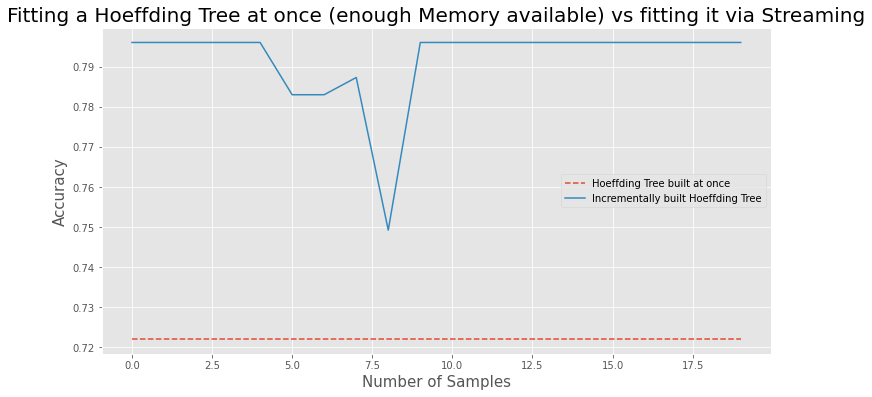

In [ ]:
timer = False
j = 0
res = []

ht_partial_cb = HoeffdingTree(leaf_prediction = 'nba', split_criterion = 'hellinger')

stopping_criterion = 20

for i in range(len(X_train_fs_cb.values)):

    ht_partial_cb.partial_fit(X_train_fs_cb.values[i].reshape(1, -1), Y_train_cb.values[i])
    
    res.append(ht_partial_cb.score(X_test_fs.values, Y_test.values))
    
    print(f'Score when streaming after {i} samples: {res[-1]}')

    if res[-1] >= ht_complete_cb_score - 0.01:
        print(f'(Almost) full score reached! Continue for another {stopping_criterion - j} samples.')
        timer = True
    else:
        timer = False

    if timer:
        j += 1
        if j == stopping_criterion:
            break

# Plot the scores after each sample.
plt.figure(figsize=(12, 6))
plt.plot([0, i], [ht_complete_cb_score, ht_complete_cb_score], '--', label='Hoeffding Tree built at once')
plt.plot(res, label='Incrementally built Hoeffding Tree')
plt.xlabel('Number of Samples', fontsize=15)
plt.ylabel('Accuracy', fontsize=15)
plt.title('Fitting a Hoeffding Tree at once (enough Memory available) vs fitting it via Streaming', fontsize=20)
plt.legend()

In [ ]:
from skmultiflow.evaluation import EvaluateHoldout
from skmultiflow.data import DataStream

dataStream = DataStream(X_test_fs.values, y=Y_test.values)

# # Set the evaluator
evaluator = EvaluateHoldout(max_samples=len(Y_test),
                            max_time=1000,
                            show_plot=False,
                            metrics=['accuracy', 'precision', 'recall', 'f1'],
                            dynamic_test_set=False)
# Run evaluation
evaluator.evaluate(stream=dataStream, model=ht_complete_grid_cb.best_estimator_, model_names=['HT'])

Holdout Evaluation
Evaluating 1 target(s).
Separating 5000 holdout samples.
Evaluating...
 #################### [100%] [10.46s]
Processed samples: 22106
Mean performance:
HT - Accuracy     : 0.7326
HT - Precision: 0.3190
HT - Recall: 0.3209
HT - F1 score: 0.3199


[HoeffdingTreeClassifier(binary_split=False, grace_period=200,
                         leaf_prediction='nba', max_byte_size=33554432,
                         memory_estimate_period=1000000, nb_threshold=0,
                         no_preprune=False, nominal_attributes=None,
                         remove_poor_atts=False, split_confidence=1e-07,
                         split_criterion='hellinger', stop_mem_management=False,
                         tie_threshold=0.05)]

### Fitting models using RandomForest Classifier and Boosting methods, which are best known algorithms for patient no-show prediction.

Fitting RandomForest Classifier.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

rf_cb = RandomForestClassifier(verbose = 1)

param_grid = {"criterion": ['gini', 'entropy']}
rf_grid_cb = GridSearchCV(estimator=rf_cb, param_grid=param_grid, refit=True, verbose=3, cv=5)
rf_grid_cb.fit(X_train_fs_cb, Y_train_cb)

Fitting 5 folds for each of 2 candidates, totalling 10 fits
[CV] criterion=gini ..................................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    9.9s remaining:    0.0s
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ...................... criterion=gini, score=0.692, total=   9.9s
[CV] criterion=gini ..................................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:   20.2s remaining:    0.0s
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ...................... criterion=gini, score=0.784, total=  10.2s
[CV] criterion=gini ..................................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ...................... criterion=gini, score=0.816, total=  10.1s
[CV] criterion=gini ..................................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ...................... criterion=gini, score=0.816, total=  10.1s
[CV] criterion=gini ..................................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ...................... criterion=gini, score=0.814, total=  10.2s
[CV] criterion=entropy ...............................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   10.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ................... criterion=entropy, score=0.693, total=  11.3s
[CV] criterion=entropy ...............................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   10.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ................... criterion=entropy, score=0.782, total=  11.7s
[CV] criterion=entropy ...............................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   10.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ................... criterion=entropy, score=0.816, total=  11.7s
[CV] criterion=entropy ...............................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   11.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ................... criterion=entropy, score=0.816, total=  11.9s
[CV] criterion=entropy ...............................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   11.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:  1.8min finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ................... criterion=entropy, score=0.814, total=  11.8s


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   11.3s finished


GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

In [ ]:
filename = './sample_data/rf_grid_cb.sav'
pickle.dump(rf_grid_cb, open(filename, 'wb'))

In [ ]:
filename = './sample_data/rf_grid_cb.sav'
rf_grid_cb = pickle.load(open(filename, 'rb'))

In [ ]:
from google.colab import files
files.download('./sample_data/rf_grid_cb.sav') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
rf_grid_cb.cv_results_

{'mean_fit_time': array([ 9.28861008, 10.89553256]),
 'mean_score_time': array([0.80437231, 0.80457044]),
 'mean_test_score': array([0.7845668 , 0.78421275]),
 'param_criterion': masked_array(data=['gini', 'entropy'],
              mask=[False, False],
        fill_value='?',
             dtype=object),
 'params': [{'criterion': 'gini'}, {'criterion': 'entropy'}],
 'rank_test_score': array([1, 2], dtype=int32),
 'split0_test_score': array([0.6920871 , 0.69251195]),
 'split1_test_score': array([0.78389095, 0.78247477]),
 'split2_test_score': array([0.816492  , 0.81642119]),
 'split3_test_score': array([0.81617335, 0.81599632]),
 'split4_test_score': array([0.81419062, 0.81365954]),
 'std_fit_time': array([0.0928161 , 0.20041169]),
 'std_score_time': array([0.01363512, 0.01202638]),
 'std_test_score': array([0.04785126, 0.04759569])}

In [ ]:
rf_grid_cb.best_params_

{'criterion': 'gini'}

In [ ]:
rf_grid_cb.best_estimator_.score(X_test_fs, Y_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished


0.7000814258572333

In [ ]:
prediction = rf_grid_cb.best_estimator_.predict(X_test_fs)

from sklearn import metrics

precision = metrics.precision_score(Y_test.values, prediction)
recall = metrics.recall_score(Y_test.values, prediction)

print("Precision: " + str(precision))
print("Recall: " + str(recall))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Precision: 0.3246817655810878
Recall: 0.43557329784874693


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished


In [ ]:
def evaluatePerf(true_labels, predicted_labels):
    type2 = 0
    type1 = 0
    true_positive = 0
    true_negative = 0
    for x,y in zip(true_labels, predicted_labels):
        if x == y:
            if x == 1:
                true_positive+=1
            else:
                true_negative+=1
        elif x == 1:
            type2 += 1
        elif x == 0:
            type1 += 1

    print("TP:", true_positive, " TN:", true_negative, " T1Err:", type1, " T2Err:", type2)

In [ ]:
evaluatePerf(Y_test.values, prediction)

TP: 1964  TN: 13512  T1Err: 4085  T2Err: 2545


Fitting AdaBoost classifier.

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import GridSearchCV

adaboost_cb = AdaBoostClassifier(n_estimators=100, random_state=0)

param_grid = {"learning_rate": [0.01, 0.1, 1]}
adaboost_grid_cb = GridSearchCV(estimator=adaboost_cb, param_grid=param_grid, refit=True, verbose=3, cv=5)
adaboost_grid_cb.fit(X_train_fs_cb, Y_train_cb.values.ravel())

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] learning_rate=0.01 ..............................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] .................. learning_rate=0.01, score=0.671, total=   6.6s
[CV] learning_rate=0.01 ..............................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    6.6s remaining:    0.0s


[CV] .................. learning_rate=0.01, score=0.664, total=   6.6s
[CV] learning_rate=0.01 ..............................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:   13.2s remaining:    0.0s


[CV] .................. learning_rate=0.01, score=0.669, total=   6.7s
[CV] learning_rate=0.01 ..............................................
[CV] .................. learning_rate=0.01, score=0.669, total=   6.6s
[CV] learning_rate=0.01 ..............................................
[CV] .................. learning_rate=0.01, score=0.669, total=   6.6s
[CV] learning_rate=0.1 ...............................................
[CV] ................... learning_rate=0.1, score=0.653, total=   6.5s
[CV] learning_rate=0.1 ...............................................
[CV] ................... learning_rate=0.1, score=0.689, total=   6.6s
[CV] learning_rate=0.1 ...............................................
[CV] ................... learning_rate=0.1, score=0.703, total=   6.6s
[CV] learning_rate=0.1 ...............................................
[CV] ................... learning_rate=0.1, score=0.699, total=   6.6s
[CV] learning_rate=0.1 ...............................................
[CV] .

[Parallel(n_jobs=1)]: Done  15 out of  15 | elapsed:  1.6min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=AdaBoostClassifier(algorithm='SAMME.R',
                                          base_estimator=None,
                                          learning_rate=1.0, n_estimators=100,
                                          random_state=0),
             iid='deprecated', n_jobs=None,
             param_grid={'learning_rate': [0.01, 0.1, 1]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=3)

In [ ]:
filename = './sample_data/adaboost_grid_cb.sav'
pickle.dump(adaboost_grid_cb, open(filename, 'wb'))

In [ ]:
filename = './sample_data/adaboost_grid_cb.sav'
adaboost_grid_cb = pickle.load(open(filename, 'rb'))

In [ ]:
from google.colab import files
files.download('./sample_data/adaboost_grid_cb.sav') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
adaboost_grid_cb.cv_results_

{'mean_fit_time': array([6.21399755, 6.17611818, 6.13610134]),
 'mean_score_time': array([0.4036808 , 0.41019921, 0.40298247]),
 'mean_test_score': array([0.66838738, 0.68886601, 0.70390651]),
 'param_learning_rate': masked_array(data=[0.01, 0.1, 1],
              mask=[False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'learning_rate': 0.01},
  {'learning_rate': 0.1},
  {'learning_rate': 1}],
 'rank_test_score': array([3, 2, 1], dtype=int32),
 'split0_test_score': array([0.67056116, 0.6527881 , 0.61929545]),
 'split1_test_score': array([0.66415295, 0.68932554, 0.70405381]),
 'split2_test_score': array([0.6693457 , 0.70315819, 0.73470472]),
 'split3_test_score': array([0.66899164, 0.69866166, 0.72957088]),
 'split4_test_score': array([0.66888543, 0.70039654, 0.73190766]),
 'std_fit_time': array([0.04977915, 0.04499761, 0.04729039]),
 'std_score_time': array([0.00185934, 0.00925392, 0.01057437]),
 'std_test_score': array([0.00219942, 0.01862794, 0.043

In [ ]:
adaboost_grid_cb.best_params_

{'learning_rate': 1}

In [ ]:
adaboost_grid_cb.best_estimator_.score(X_test_fs, Y_test)

0.6378358816610875

In [ ]:
prediction = adaboost_grid_cb.best_estimator_.predict(X_test_fs)

from sklearn import metrics

precision = metrics.precision_score(Y_test, prediction)
recall = metrics.recall_score(Y_test, prediction)

print("Precision: " + str(precision))
print("Recall: " + str(recall))

Precision: 0.31119749487096426
Recall: 0.6391661122200044


In [ ]:
evaluatePerf(Y_test.values, prediction)

TP: 2882  TN: 11218  T1Err: 6379  T2Err: 1627


## Evaluation

Loading Trained Models Without Class Balancing

In [7]:
# RIPPER
filename = './sample_data/ripper_grid.sav'
ripper_grid = pickle.load(open(filename, 'rb'))

# HOEFFDING TREE
filename = './sample_data/ht_complete_grid.sav'
ht_complete_grid = pickle.load(open(filename, 'rb'))

# RANDOM FOREST
filename = './sample_data/rf_grid.sav'
rf_grid = pickle.load(open(filename, 'rb'))

# ADABOOST
filename = './sample_data/adaboost_grid.sav'
adaboost_grid = pickle.load(open(filename, 'rb'))

Loading Trained Models With Class Balancing

In [8]:
# RIPPER
filename = './sample_data/ripper_clf_cb.sav'
ripper_clf_cb = pickle.load(open(filename, 'rb'))

# HOEFFDING TREE
filename = './sample_data/ht_complete_grid_cb.sav'
ht_complete_grid_cb = pickle.load(open(filename, 'rb'))

# RANDOM FOREST
filename = './sample_data/rf_grid_cb.sav'
rf_grid_cb = pickle.load(open(filename, 'rb'))

# ADABOOST
filename = './sample_data/adaboost_grid_cb.sav'
adaboost_grid_cb = pickle.load(open(filename, 'rb'))

Loading Data

In [10]:
# test data

filename = './sample_data/X_test_fs.sav'
X_test_fs = pickle.load(open(filename, 'rb'))

filename = './sample_data/Y_test.sav'
Y_test = pickle.load(open(filename, 'rb'))

Function to get Prediction Accuracy.

In [11]:
from sklearn.metrics import accuracy_score

def getPredictionAcc(model, test_data, test_labels):
  predict_labels = model.predict(test_data)
  
  return accuracy_score(test_labels, predict_labels)


Function to get Sensitivity.

In [28]:
from sklearn.metrics import confusion_matrix

def getSensitivity(model, test_data, test_labels):

  predict_labels = model.predict(test_data)

  tn, fp, fn, tp = confusion_matrix(test_labels, predict_labels).ravel()
  
  sensitivity = tp / (tp+fn)
  
  return sensitivity

Function to get Specificity.

In [40]:
from sklearn.metrics import confusion_matrix

def getSpecificity(model, test_data, test_labels):

  predict_labels = model.predict(test_data)
  print(predict_labels)

  tn, fp, fn, tp = confusion_matrix(test_labels, predict_labels).ravel()
  
  specificity = tn / (tn+fp)
  
  return specificity

Function to get AUC.

In [43]:
from sklearn import metrics

def getAUC(model, test_data, test_labels):

  predict_labels = model.predict(test_data)

  fpr, tpr, thresholds = metrics.roc_curve(test_labels, predict_labels, pos_label=1)
  auc = metrics.auc(fpr, tpr)
  
  return auc

In [45]:
getAUC(ht_complete_grid_cb.best_estimator_, X_test_fs.values, Y_test.values)

0.5844340818341218